In [4]:
!pip install torch
!pip install torchvision
!pip install torch_tensorrt


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [7]:
import torch
from torchvision import models, transforms
from PIL import Image
import torch_tensorrt as rt


Unable to import quantization op. Please install modelopt library (https://github.com/NVIDIA/TensorRT-Model-Optimizer?tab=readme-ov-file#installation) to add support for compiling quantized models
TensorRT-LLM is not installed. Please install TensorRT-LLM or set TRTLLM_PLUGINS_PATH to the directory containing libnvinfer_plugin_tensorrt_llm.so to use converters for torch.distributed ops


[03/21/2025-22:09:20] [TRT] [W] Functionality provided through tensorrt.plugin module is experimental.


In [8]:
print(rt.__version__)


2.6.0


### load a pretrained neural network

In [9]:
#using cpu
model = models.resnet50(pretrained=True)

#using gpu
# model = models.resnet50(pretrained=True).to("cuda")


### load an example image for prediction

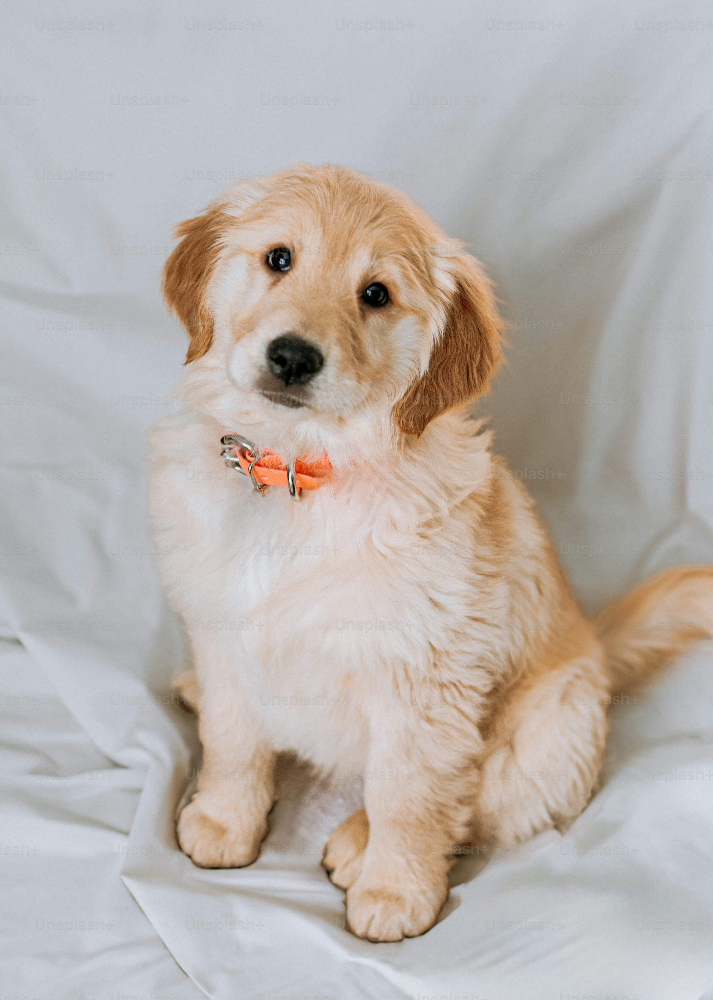

In [10]:
image = Image.open("./dog_photo.jpeg")
image


### transform example(preprocessing)

In [11]:
transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        
]
)
img = transform(image)
img.shape

torch.Size([3, 224, 224])

### set a batch size to example image

In [12]:
img_batch = torch.unsqueeze(img, dim=0)  
img_batch.shape

torch.Size([1, 3, 224, 224])

### make prediction and get probabilities for each class

In [13]:
# lets make a prediction
model.eval()
with torch.no_grad():
    outputs = model(img_batch)
outputs.shape
    

torch.Size([1, 1000])

In [18]:
probs = torch.nn.functional.softmax(outputs[0], dim=0)
probs.shape

torch.Size([1000])

In [19]:
import pandas as pd

In [20]:
categories = pd.read_csv('https://raw.githubusercontent.com/pytorch/hub/refs/heads/master/imagenet_classes.txt', header=None)
categories[0]

0                  tench
1               goldfish
2      great white shark
3            tiger shark
4             hammerhead
             ...        
995            earthstar
996     hen-of-the-woods
997               bolete
998                  ear
999        toilet tissue
Name: 0, Length: 1000, dtype: object

In [21]:
categories[0][0]

'tench'

### extract top 5 probabilities and map them to the appropriate class name


In [22]:
topk = 5
prob, class_num = torch.topk(probs, topk)
print(prob, class_num)
for i in range(topk):
    probability = prob[i].item()
    class_name = categories[0][int(class_num[i])]
    print("%{}{}".format((probability)*100, class_name))


tensor([0.9445, 0.0136, 0.0131, 0.0048, 0.0039]) tensor([207, 208, 215, 852, 205])
%94.45292353630066golden retriever
%1.3577930629253387Labrador retriever
%1.3131409883499146Brittany spaniel
%0.477098161354661tennis ball
%0.386383174918592flat-coated retriever


### define speed test benchmark function and adjust it

In [23]:
import time
import numpy as np

import torch.backends.cudnn as cudnn
cudnn.benchmark = True

def benchmark(model, device="cuda", input_shape=(32, 3, 224, 224), dtype='fp32', nwarmup=50, nruns=100):
    input_data = torch.randn(input_shape)
    input_data = input_data.to(device)
        
    print("Warm up ...")
    with torch.no_grad():
        for _ in range(nwarmup):
            features = model(input_data)
    torch.cuda.synchronize()
    print("Start timing ...")
    timings = []
    with torch.no_grad():
        for i in range(1, nruns+1):
            start_time = time.time()
            features = model(input_data)
            torch.cuda.synchronize()
            end_time = time.time()
            timings.append(end_time - start_time)
            if i%10==0:
                print('Iteration %d/%d, ave batch time %.2f ms'%(i, nruns, np.mean(timings)*1000))

    print("Input shape:", input_data.size())
    print("Output features size:", features.size())
    print('Average batch time: %.2f ms'%(np.mean(timings)*1000))

In [24]:
benchmark(model, "cpu")

Warm up ...
Start timing ...
Iteration 10/100, ave batch time 1370.19 ms
Iteration 20/100, ave batch time 1345.15 ms
Iteration 30/100, ave batch time 1335.30 ms
Iteration 40/100, ave batch time 1334.37 ms
Iteration 50/100, ave batch time 1331.22 ms
Iteration 60/100, ave batch time 1327.75 ms
Iteration 70/100, ave batch time 1324.31 ms
Iteration 80/100, ave batch time 1322.15 ms
Iteration 90/100, ave batch time 1321.84 ms
Iteration 100/100, ave batch time 1321.46 ms
Input shape: torch.Size([32, 3, 224, 224])
Output features size: torch.Size([32, 1000])
Average batch time: 1321.46 ms


In [25]:
model.to("cuda")
benchmark(model)

Warm up ...
Start timing ...
Iteration 10/100, ave batch time 30.38 ms
Iteration 20/100, ave batch time 30.38 ms
Iteration 30/100, ave batch time 30.38 ms
Iteration 40/100, ave batch time 30.38 ms
Iteration 50/100, ave batch time 30.38 ms
Iteration 60/100, ave batch time 30.38 ms
Iteration 70/100, ave batch time 30.38 ms
Iteration 80/100, ave batch time 30.38 ms
Iteration 90/100, ave batch time 30.38 ms
Iteration 100/100, ave batch time 30.38 ms
Input shape: torch.Size([32, 3, 224, 224])
Output features size: torch.Size([32, 1000])
Average batch time: 30.38 ms


In [26]:
traced_model = torch.jit.trace(model, [torch.randn((32, 3, 224, 224)).to("cuda")])

In [27]:
!pip install torch_tensorrt


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [29]:
import torch
import torch_tensorrt

print("PyTorch Version:", torch.__version__)
print("Torch-TensorRT Version:", torch_tensorrt.__version__)

PyTorch Version: 2.6.0+cu124
Torch-TensorRT Version: 2.6.0


In [30]:
import torch_tensorrt

trt_model = torch_tensorrt.compile(
    traced_model,
    inputs = [torch_tensorrt.Input((32, 3, 224, 224), dtype=torch.float32)],
    enabled_precisions = {torch.float32}
)

Input is a torchscript module but the ir was not specified (default=dynamo), please set ir=torchscript to suppress the warning.


In [31]:
benchmark(trt_model)


Warm up ...
Start timing ...
Iteration 10/100, ave batch time 13.65 ms
Iteration 20/100, ave batch time 13.65 ms
Iteration 30/100, ave batch time 13.65 ms
Iteration 40/100, ave batch time 13.64 ms
Iteration 50/100, ave batch time 13.64 ms
Iteration 60/100, ave batch time 13.64 ms
Iteration 70/100, ave batch time 13.64 ms
Iteration 80/100, ave batch time 13.64 ms
Iteration 90/100, ave batch time 13.64 ms
Iteration 100/100, ave batch time 13.64 ms
Input shape: torch.Size([32, 3, 224, 224])
Output features size: torch.Size([32, 1000])
Average batch time: 13.64 ms
